In [1]:
!sudo apt-get install tree
!pip install -qq torchmetrics[detection]
!pip install -qq pycocotools
!pip install -qq tensorboard

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.


In [2]:
!git clone https://github.com/pytorch/vision.git


fatal: destination path 'vision' already exists and is not an empty directory.


In [3]:
import os
import gc
import json
import math
import sys
import random
import requests
import zipfile
import numpy as np
from PIL import Image, ImageDraw, ImageFont, ImageOps, ImageStat
import PIL
from torchsummary import summary
import torch
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
sys.path.append('/content/vision/references/detection')
from utils import MetricLogger, SmoothedValue, collate_fn
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Patch
import logging
from tqdm import tqdm

from torchmetrics.detection.mean_ap import MeanAveragePrecision
from dataclasses import dataclass
import torchvision
from vision.references.detection import utils

import torchvision.transforms as T
from torchvision.transforms import v2 as Tv2
from torchvision import tv_tensors
from torchvision.transforms import functional as F
from torchvision.transforms.functional import to_pil_image
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from tqdm import tqdm
from tabulate import tabulate
import torchvision.models.detection as detection
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.transform import GeneralizedRCNNTransform

In [4]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# **Download Dataset - Preprocessed as patches**

To save time and compute directly, download the patches we created by running the following script. This script skips  the dataset preprocessing function for patch creation.

In [5]:
sea_drone_dir = "SeaDroneSee"
os.makedirs(sea_drone_dir, exist_ok=True)

!wget -O {sea_drone_dir}/SeaDroneSee.zip "https://www.dropbox.com/scl/fi/0oyv9pki57laqgmq7matd/SeaDroneSee.zip?rlkey=yasyxr0u3450dylv5musks1s0&st=q12t3tc3&dl=1"

--2025-04-03 09:33:05--  https://www.dropbox.com/scl/fi/0oyv9pki57laqgmq7matd/SeaDroneSee.zip?rlkey=yasyxr0u3450dylv5musks1s0&st=q12t3tc3&dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8e2ede2a5ad31ff6ea727dfab3.dl.dropboxusercontent.com/cd/0/inline/CnGdLvBpIwTLY2iudcVOS5tlRfYCHaoC9-wE3vdMMesc0Rb_WtZynDlZIXyNoBHMSk5impDYC8k9IQCXUZkX6-rHfRVNr6MFLGTo5msT7uedMDEBSiypUrHGH1wmKJCZbKc5ZhmcxgTcy_QQ-qt7JCmX/file?dl=1# [following]
--2025-04-03 09:33:05--  https://uc8e2ede2a5ad31ff6ea727dfab3.dl.dropboxusercontent.com/cd/0/inline/CnGdLvBpIwTLY2iudcVOS5tlRfYCHaoC9-wE3vdMMesc0Rb_WtZynDlZIXyNoBHMSk5impDYC8k9IQCXUZkX6-rHfRVNr6MFLGTo5msT7uedMDEBSiypUrHGH1wmKJCZbKc5ZhmcxgTcy_QQ-qt7JCmX/file?dl=1
Resolving uc8e2ede2a5ad31ff6ea727dfab3.dl.dropboxusercontent.com (uc8e2ede2a5ad31ff6ea727dfab3.dl.dropboxusercon

In [6]:
!wget -O {sea_drone_dir}/SeaDroneSee_test.zip "https://www.dropbox.com/scl/fi/4qidpahgu9mogam33uxlz/SeaDroneSee_test.zip?rlkey=1gt6mebuppxg4ehzhicwqafav&st=5g01mcdb&dl=1"

--2025-04-03 09:41:54--  https://www.dropbox.com/scl/fi/4qidpahgu9mogam33uxlz/SeaDroneSee_test.zip?rlkey=1gt6mebuppxg4ehzhicwqafav&st=5g01mcdb&dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.67.18, 2620:100:6035:18::a27d:5512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.67.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc00fb36fd47aa9655e436a09828.dl.dropboxusercontent.com/cd/0/inline/CnHvAV98NOrmKhBcWtHU5P04rJ46UsXwxRcjUx5hdROzTxjKpistwFJvXZf_pOJJEeselKNW-u-3hmZoT5otAbDH0ibZIRkzlURBj-InntVubPKvw-IyHM01kEqKXKId77492JBqs5Z-Mcg_d2scbxay/file?dl=1# [following]
--2025-04-03 09:41:56--  https://uc00fb36fd47aa9655e436a09828.dl.dropboxusercontent.com/cd/0/inline/CnHvAV98NOrmKhBcWtHU5P04rJ46UsXwxRcjUx5hdROzTxjKpistwFJvXZf_pOJJEeselKNW-u-3hmZoT5otAbDH0ibZIRkzlURBj-InntVubPKvw-IyHM01kEqKXKId77492JBqs5Z-Mcg_d2scbxay/file?dl=1
Resolving uc00fb36fd47aa9655e436a09828.dl.dropboxusercontent.com (uc00fb36fd47aa9655e436a09828.dl.dropboxus

# Download and Unzip Files

In [7]:
def download_file(url, save_name):
    if not os.path.exists(save_name):
        with requests.get(url, allow_redirects=True) as r:
            if r.status_code == 200:
                with open(save_name, 'wb') as f:
                    f.write(r.content)
            else:
                print("Failed to download the file, status code:", r.status_code)

def unzip(zip_file, target_dir):
    try:
        with zipfile.ZipFile(zip_file, 'r') as z:
            z.extractall(target_dir)
            print("Extracted all to:", target_dir)
    except zipfile.BadZipFile:
        print("Invalid file or error during extraction: Bad Zip File")
    except Exception as e:
        print("An error occurred:", e)

save_path = '/content/SeaDroneSee/SeaDroneSee.zip'
model_ckpt_url = 'https://www.dropbox.com/scl/fi/xmftrum0a8rgjp82j6n65/model_ckpt.zip?rlkey=aywwl28rbcbiejggdps0durfu&st=dda61bld&dl=1'
model_save_path = 'SeaDroneSee/Model_ckpt.zip'


In [8]:

download_file(model_ckpt_url, model_save_path)
unzip(model_save_path, '/content/SeaDroneSee')
unzip(save_path, '/content/SeaDroneSee')

test_save_path = '/content/SeaDroneSee/SeaDroneSee_test.zip'
unzip(test_save_path, '/content/SeaDroneSee')


Extracted all to: /content/SeaDroneSee
Extracted all to: /content/SeaDroneSee
Extracted all to: /content/SeaDroneSee


In [9]:
!tree --dirsfirst -L 2 "/content/SeaDroneSee/SeaDroneSee/output_patches"

/content/SeaDroneSee/SeaDroneSee/output_patches
├── annotations
│   ├── instances_patches_train.json
│   └── instances_patches_val.json
└── images
    ├── train
    └── val

4 directories, 2 files


# **Class mapping**

### Let's do a class mapping and assign a unique color for each label or class ID.

In [10]:
classes_to_idx = {
    0: 'ignored',
    1: 'swimmer',
    2: 'boat',
    3: 'jetski',
    4: 'life_saving_appliances',
    5: "buoy"
}

# Mapping category IDs to colors
category_colors = {
    0: 'black',   # ignored
    1: 'red',     # swimmer
    2: 'orange',   # boat
    3: 'blue',    # jetski
    4: 'purple',  # life saving appliances
    5: 'yellow'   # buoy
}

* Understanding the dataset is a vital step in any deep-learning project. Therefore, we will dedicate significant time to applying preprocessing techniques to this dataset.

* To analyze and visualize the ground truth annotations, let's define a draw_bounding_boxes utility. Proper handling of bounding box formats is crucial in object detection, as any mismatch can impact the fine-tuning of our Faster RCNN pipeline. Since our dataset annotations are in the XYWH format, we will convert them to the XYXY format, which is required by PIL’s Image Draw function.

In [11]:
def draw_bounding_boxes(image, bboxes):
    draw = ImageDraw.Draw(image)
    font_size = int(min(image.size) * 0.02)  # Adjust font size based on image size
    font_path = "/content/Hack-Bold.ttf"
    font = ImageFont.truetype(font_path, font_size) if os.path.exists(font_path) else ImageFont.load_default()

    for bbox, category_id in bboxes:
        x, y, w, h = bbox
        x1, y1, x2, y2 = x, y, x + w, y + h
        color = category_colors.get(category_id, 'white')  # Default to white if category_id is unknown
        draw.rectangle([x1, y1, x2, y2], outline=color, width=4)
        draw.text((x1, y1 - font_size), str(category_id), fill=color, font=font)

    return image



* The load_annotations utility takes the path of instances_patches_train.json or instaces_patches_val.json to load them and returns their annotations.




In [12]:
def load_annotations(annotation_path):
    with open(annotation_path, 'r') as f:
         annotations = json.load(f)
    return annotations

* After loading, we will iterate over each bounding box with their image ID from the annotations, and using matplotlib, we will plot the ground truth with an arbitrary number of samples of our choice.

In [13]:

def visualize_patch_samples(image_dir, annotation_path, num_samples=5):
    """Visualizes a set of random image samples with bounding boxes."""

    annotations = load_annotations(annotation_path)
    images_with_bboxes = {}

    # Collect image paths and corresponding bounding boxes
    for annot in annotations['annotations']:
        images_with_bboxes.setdefault(annot['image_id'], []).append((annot['bbox'], annot['category_id']))

    # Convert dict_keys to list before sampling
    sampled_images = random.sample(list(images_with_bboxes.keys()), min(num_samples, len(images_with_bboxes)))

    # Plot images with bounding boxes
    plt.figure(figsize=(15, num_samples * 4))
    for i, image_id in enumerate(sampled_images):
        image_path = os.path.join(image_dir, image_id)
        if not os.path.exists(image_path):
            continue

        image = Image.open(image_path)
        image = draw_bounding_boxes(image, images_with_bboxes[image_id])

        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Image ID: {image_id}")

    plt.tight_layout()
    plt.show()


# Visualize Patch Ground Truth

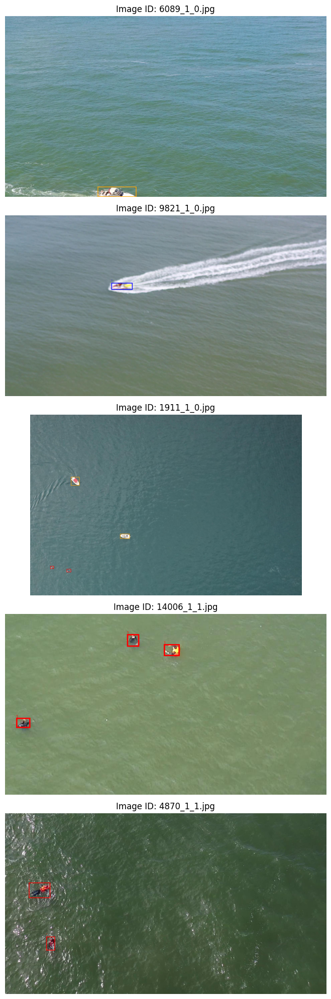

In [14]:
image_dir = '/content/SeaDroneSee/SeaDroneSee/output_patches/images/val'
annotation_path = '/content/SeaDroneSee/SeaDroneSee/output_patches/annotations/instances_patches_val.json'

visualize_patch_samples(image_dir,annotation_path,num_samples=5)

# Visualize Images From Train Data

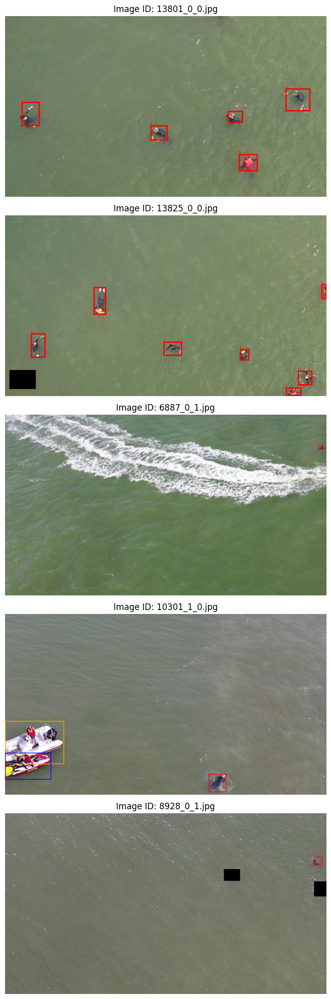

In [15]:
image_dir = '/content/SeaDroneSee/SeaDroneSee/output_patches/images/train'
annotation_path = '/content/SeaDroneSee/SeaDroneSee/output_patches/annotations/instances_patches_train.json'

visualize_patch_samples(image_dir,annotation_path,num_samples=5)

# **DataClass Preparation**

This line defines a dataclass named DatasetConfig for storing configuration parameters for a dataset.

In [16]:
@dataclass
class DatasetConfig:
    root: str
    annotations_file: str
    train_img_size: tuple
    subset: str = 'train'  # Default to 'train'
    transforms: any = None

Here the `CustomAerialDataset` class is designed to handle aerial image datasets and perform tasks such as loading images, handling annotations, and preparing data to fine-tuning Faster R-CNN model.

Below is a brief overview of its key functionalities:

* The class takes a `DatasetConfig` object that contains the root directory, image size, subset (train/val/test), and any transformations.
It initializes paths for images and annotations and calls methods to load them.

*  The `_load_images` method scans the specified subset directory and appends valid image file paths to the `imgs` list.
Each image is given an empty annotation initially.

* Then the `_load_annotations` method reads a JSON file containing bounding box annotations.
It matches each annotation to its corresponding image and stores the bounding box coordinates and category IDs.


* The `__getitem__` method retrieves an image and its annotations by index.
It handles missing images by returning a zero tensor and a dummy target if there are no instances within an image. This is done because while enumerating a batch of image and its corresponding target the loss calculation expects a target of shape (N,4). If we just pass the image without an instance this will throw an error like expected a tensor of shape (N,4) but received torch.size([0]).

* Then the image is resized to the specified dimensions, and bounding boxes are scaled accordingly to reduce the training time and GPU hours.
* The target here will be a dictionary of box tensors and their equivalent label tensor of data type float32 and int64 respectively.
  
* Whatever the transformations by torch.transforms.functional will be applied to both image and target to ensure valid augmentation is performed to improve model performance.



In [17]:
class CustomAerialDataset(Dataset):
    def __init__(self, config: DatasetConfig):
        self.root = config.root
        self.transforms = config.transforms
        self.train_img_size = config.train_img_size
        self.subset = config.subset
        self.annotations_file = os.path.join(self.root, 'annotations', f'instances_patches_{self.subset}.json')
        self.imgs = []
        self.img_annotations = {}
        self._load_images()
        self._load_annotations()

    def __len__(self):
        return len(self.imgs)

    def _load_images(self):
        # Load all images from the subset directory
        images_path = os.path.join(self.root, 'images', self.subset)
        for image_filename in os.listdir(images_path):
            image_path = os.path.join(images_path, image_filename)
            if os.path.isfile(image_path) and image_path.endswith(('.png', '.jpg', '.jpeg')):
                self.imgs.append(image_path)
                image_id = os.path.basename(image_path)
                # Initialize empty annotations for each image
                if image_id not in self.img_annotations:
                    self.img_annotations[image_id] = {'boxes': [], 'labels': []}

    def _load_annotations(self):
        with open(self.annotations_file, 'r') as f:
            data = json.load(f)
        for annotation in data['annotations']:
            image_id = annotation["image_id"]
            bbox = annotation["bbox"]
            category_id = annotation["category_id"]
            image_path = os.path.join(self.root, 'images', self.subset, image_id)
            if image_id in self.img_annotations:
                self.img_annotations[image_id]['boxes'].append(bbox)
                self.img_annotations[image_id]['labels'].append(category_id)

    def __getitem__(self, idx):
        img_path = self.imgs[idx]
        if not os.path.exists(img_path):
            # Return a default image (like a zero tensor) and a dummy target
            default_img = torch.zeros(3, *self.train_img_size)  # Assuming 3 color channels
            default_target = {'boxes': torch.tensor([[0, 0, 0, 0]], dtype=torch.float32),
                              'labels': torch.tensor([0], dtype=torch.int64)}  # Background
            return default_img, default_target

        img = Image.open(img_path).convert("RGB")
        orig_width, orig_height = img.size
        scale_x = self.train_img_size[0] / orig_width
        scale_y = self.train_img_size[1] / orig_height
        img = img.resize(self.train_img_size, Image.BILINEAR)
        img = F.to_tensor(img)

        annotations = self.img_annotations[os.path.basename(img_path)]
        if annotations['boxes']:
            scaled_boxes = [[max(0, min(bbox[0] * scale_x, self.train_img_size[0])),
                             max(0, min(bbox[1] * scale_y, self.train_img_size[1])),
                             max(0, min((bbox[0] + bbox[2]) * scale_x, self.train_img_size[0])),
                             max(0, min((bbox[1] + bbox[3]) * scale_y, self.train_img_size[1]))]
                            for bbox in annotations['boxes']]
            labels = annotations['labels']
        else:
            scaled_boxes = [[0, 0, 0, 0]]
            labels = [0]

        boxes = torch.tensor(scaled_boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        target = {'boxes': boxes, 'labels': labels}
        if self.transforms:
            img, target = self.transforms(img, target)
        return img, target

# Data Transformation Function for Object Detection

In [18]:
def get_transform(train=True):
    transforms = [
        Tv2.ToDtype(torch.float, scale=True),
        Tv2.ToPureTensor(),
    ]

    if train:
        transforms.insert(0, Tv2.RandomHorizontalFlip(0.5))

    return Tv2.Compose(transforms)

# Custom Aerial Dataset for Object Detection

## Dataset Initialization
The `CustomAerialDataset` class is responsible for loading images and annotations from the dataset directory. It supports transformations and prepares data for training an object detection model.

### Key Components:
1. **Dataset Configuration (`DatasetConfig`)**
   - Defines root directory, image size, annotation file paths, and transformations.

2. **Image & Annotation Loading**
   - `_load_images()`: Loads image file paths from the dataset.
   - `_load_annotations()`: Reads annotation JSON and maps bounding boxes to images.

3. **Data Retrieval (`__getitem__`)**
   - Loads an image, resizes it, and converts it to a tensor.
   - Converts bounding box format from `XYWH` to `XYXY`.
   - Applies transformations if provided.

### Handling Missing Images
If an image path is missing, a placeholder image (zero tensor) is returned with dummy bounding boxes.

### Dataset Initialization
The dataset is created for both training and validation using:

```python
train_dataset = CustomAerialDataset(train_dataset_config)
val_dataset = CustomAerialDataset(val_dataset_config)


In [19]:
root = "/content/SeaDroneSee/SeaDroneSee/output_patches"

train_dataset_config = DatasetConfig(
            root=root,
            annotations_file='annotations/instances_patches_train.json',
            train_img_size=(384,216),
            subset='train',
            transforms=get_transform(train=True))

val_dataset_config = DatasetConfig(
            root=root,
            annotations_file='annotations/instances_patches_val.json',
            train_img_size=(384, 216),
            subset='val',
            transforms=get_transform(train=False))



train_dataset = CustomAerialDataset(train_dataset_config)
val_dataset = CustomAerialDataset(val_dataset_config)

In [20]:
print(f"Length of Train Dataset: {len(train_dataset)}")
print(f"Length of Validation Dataset: {len(val_dataset)}")

Length of Train Dataset: 35720
Length of Validation Dataset: 6188


# Create an iterator for the dataset

In [21]:

train_iter = iter(train_dataset)
val_iter = iter(val_dataset)

# Fetch one sample from training and validation sets
train_img, train_target = next(train_iter)
val_img, val_target = next(val_iter)

# Print shapes
print("Train Image Shape:", train_img.shape)  # Should be (C, H, W)
print("Train Bounding Boxes Shape:", train_target["boxes"].shape)  # (num_boxes, 4)
print("Train Labels Shape:", train_target["labels"].shape)  # (num_boxes,)

print("\nVal Image Shape:", val_img.shape)
print("Val Bounding Boxes Shape:", val_target["boxes"].shape)
print("Val Labels Shape:", val_target["labels"].shape)


Train Image Shape: torch.Size([3, 216, 384])
Train Bounding Boxes Shape: torch.Size([1, 4])
Train Labels Shape: torch.Size([1])

Val Image Shape: torch.Size([3, 216, 384])
Val Bounding Boxes Shape: torch.Size([7, 4])
Val Labels Shape: torch.Size([7])


* After the patch creation, there are 35270 train images and 6188 validation images which will be the final set of input images for fine-tuning Faster R-CNN model.

* We define a custom `collate function` to handle images without annotations. We need to pass these empty instance images as they can improve the model's performance and avoid False Positives (Here, `Background` is misidentified as an object instance).


In [22]:
def collate_fn(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs, dim=0)
    real_targets = []
    for target in targets:
        # Filter out dummy boxes
        mask = target['boxes'].sum(dim=1) > 0
        real_targets.append({'boxes': target['boxes'][mask], 'labels': target['labels'][mask]})
    return imgs, real_targets

train_data_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, collate_fn=collate_fn, num_workers=12)
val_data_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, collate_fn=collate_fn, num_workers=12)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


### Let's visualize samples from the train_data_loader to check whether our custom data dataset class is properly defined.

(384, 216)
(384, 216)
(384, 216)
(384, 216)
(384, 216)


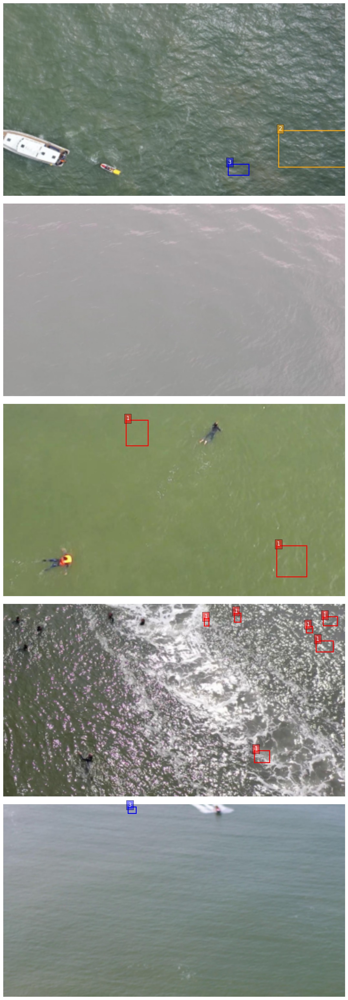

In [23]:
def show_image_with_boxes(img, targets, ax, category_colors):
    """Plot an image with its bounding boxes on an axis object."""
    # Convert tensor image to PIL for display if needed
    if isinstance(img, torch.Tensor):
        img = to_pil_image(img)
        print(img.size)
    ax.imshow(img)

    # Check and plot each bounding box with class-specific color
    if 'boxes' in targets and 'labels' in targets:
        boxes = targets['boxes'].cpu().numpy()
        labels = targets['labels'].cpu().numpy()
        for bbox, label in zip(boxes, labels):
            w = bbox[2]-bbox[0]
            h = bbox[3]-bbox[1]
            color = category_colors.get(label, 'gray')  # Use gray for unmapped classes
            rect = patches.Rectangle((bbox[0], bbox[1]), w, h, linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            ax.text(bbox[0], bbox[1], str(label), color='white', fontsize=12, bbox=dict(facecolor=color, alpha=0.5))

def visualize_samples(data_loader, category_colors, num_samples=20):
    """Visualize a specified number of samples from a DataLoader in a single column."""
    num_rows = num_samples  # All samples in a single column
    num_cols = 1
    fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 25 * num_rows // 4))  # Adjust height based on rows
    samples_visualized = 0

    for images, targets in data_loader:
        for i, ax in enumerate(axs.flat):
            if samples_visualized >= num_samples:
                break  # Stop after displaying the desired number of samples

            show_image_with_boxes(images[i], targets[i], ax, category_colors)
            ax.axis('off')  # Turn off axis for cleaner look
            samples_visualized += 1

        # If enough samples visualized, break the loop to avoid extra iterations
        if samples_visualized >= num_samples:
            break

    plt.tight_layout()
    plt.show()


# Assuming train_data_loader is defined and loaded correctly
visualize_samples(train_data_loader, category_colors, num_samples=5)


(384, 216)
(384, 216)
(384, 216)
(384, 216)
(384, 216)


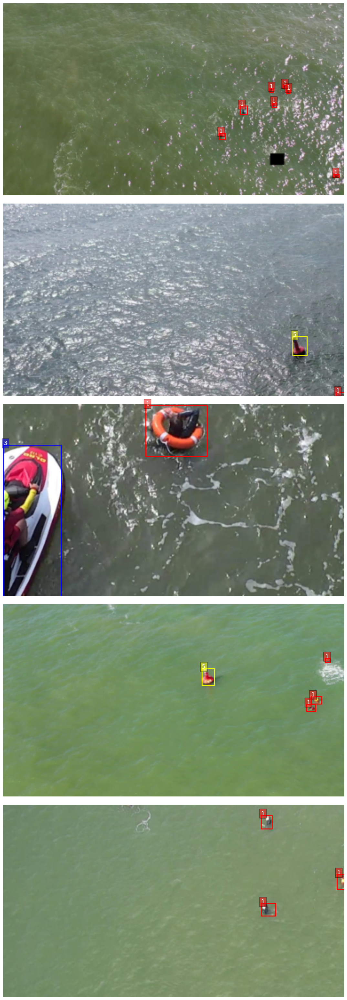

In [24]:
visualize_samples(val_data_loader, category_colors, num_samples=5)

# Function to visualize predictions with ground truth and predicted bounding boxes

In [25]:

def create_directory(path):
    """Create a directory if it does not exist."""
    if not os.path.exists(path):
        os.makedirs(path)

def visualize_predictions(images, outputs, targets, save_dir, epoch, writer):
    """
    Visualizes ground truth and predicted bounding boxes on images.

    Args:
        images (list of torch.Tensor): List of image tensors.
        outputs (list of dicts): Model predictions containing 'boxes' and 'labels'.
        targets (list of dicts): Ground truth containing 'boxes' and 'labels'.
        save_dir (str): Directory to save the visualizations.
        epoch (int): Current training epoch.
        writer (SummaryWriter): TensorBoard writer for logging images.

    Returns:
        list: List of figure objects for further processing.
    """
    create_directory(save_dir)
    figures = []

    for idx, (image, output, target) in enumerate(zip(images, outputs, targets)):
        try:
            # Convert image tensor to numpy array and clip values to [0, 1] range
            image = image.permute(1, 2, 0).cpu().numpy()
            image = np.clip(image, 0, 1)

            fig, ax = plt.subplots(figsize=(8, 8))
            ax.imshow(image)

            # Plot ground truth bounding boxes
            for box, label in zip(target['boxes'], target['labels']):
                box = box.cpu().numpy()
                xmin, ymin, xmax, ymax = box
                color = category_colors.get(label.item(), 'blue')
                rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, edgecolor=color, linewidth=2)
                ax.add_patch(rect)
                ax.text(xmin, ymin, f'{classes_to_idx[label.item()]} ({label.item()})',
                        bbox=dict(facecolor=color, alpha=0.5), color='white')

            # Plot predicted bounding boxes
            for box, label in zip(output['boxes'], output['labels']):
                box = box.cpu().numpy()
                xmin, ymin, xmax, ymax = box
                rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, edgecolor='red', linewidth=2)
                ax.add_patch(rect)
                ax.text(xmin, ymin, f'Pred: {label.item()}',
                        bbox=dict(facecolor='red', alpha=0.5), color='white')

            ax.axis('off')
            plt.tight_layout()

            # Save the visualization
            save_path = os.path.join(save_dir, f'prediction_epoch_{epoch}_image_{idx}.png')
            plt.savefig(save_path, bbox_inches='tight', dpi=300)
            writer.add_figure(f'Predictions/epoch_{epoch}_image_{idx}', fig, epoch)

            figures.append(fig)
            plt.close(fig)
        except Exception as e:
            print(f"Error while visualizing prediction for index {idx}: {e}")

    return figures


# **MODEL CONFIGURATION**

* We have four detection backbone models trained on the COCO Dataset from torchvision models for fine-tuning Faster R-CNN. We will exploit these pretrained weights to achieve very good detection accuracy within fewer epochs.

* However, there are other Object Detection architectures as well, such as SSD, RetinaNet, etc., if you would like to give them a try.

* To fit in our Google Colab T4 GPU memory, we will choose a lightweight mobilenet v3 large backbone with around 19.4M parameters, 4.49 GFLOPS, and 32.8 Box mAP on the MSCOCO dataset.

* As our dataset contains six classes, we will modify the pretrained classification head’s final layer to reflect the number of classes in SeaDroneSee. We will use an SGD optimizer with a momentum of 0.9, an initial learning rate of 5e-4, and StepLR to adjust the learning rate every total_epochs/2 (i.e., at the 25th epoch for a total of 50 epochs)


In [26]:
def create_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(weights="DEFAULT")
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model
num_classes=6
model=create_model(num_classes)
model.to(device)
model

Downloading: "https://download.pytorch.org/models/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_mobilenet_v3_large_fpn-fb6a3cc7.pth
100%|██████████| 74.2M/74.2M [00:00<00:00, 118MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block):

# **TRAINING**

* To save compute and training time, we will use CUDA Automatic Mixed Precision (AMP) with torch.cuda.amp.GradScaler(), which enables mixed precision by using lower precision (16-bit) for some computations while maintaining single precision (32-bit) for critical parts to ensure accuracy.

* We will monitor all our training and validation metrics, as well as validation predictions, using TensorBoard via torch.utils.tensorboard with add_scalar and add_figure. For each batch in the data loader, images and targets are moved to the specified device (either CUDA or CPU). The model is set to train mode, and predictions and losses are computed. The losses are backpropagated, and optimizers and the learning rate scheduler are applied. For multi-GPU training, losses are averaged across all GPUs. This training pipeline effectively uses a metric logger from torchvision utilities to display metrics at the end of each epoch.


In [27]:
def train_one_epoch(model, data_loader, device, optimizer, print_freq, epoch, scaler=None):
    model.train()
    metric_logger = MetricLogger(delimiter="  ")
    metric_logger.add_meter("lr", SmoothedValue(window_size=1, fmt="{value:.6f}"))
    header = f"Training Epoch {epoch}:"

    with tqdm(data_loader, desc=header, leave=False) as tq:
        for i, (images, targets) in enumerate(tq):
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            with torch.amp.autocast('cuda', enabled=scaler is not None):  # Updated for PyTorch 2.x
                loss_dict = model(images, targets)
                losses = sum(loss for loss in loss_dict.values())

            optimizer.zero_grad()
            if scaler is not None:
                scaler.scale(losses).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                losses.backward()
                optimizer.step()

            metric_logger.update(loss=losses, **loss_dict)
            metric_logger.update(lr=optimizer.param_groups[0]["lr"])

            if i % print_freq == 0:
                tq.set_postfix(loss=losses.item(), lr=optimizer.param_groups[0]["lr"])

            global_step = epoch * len(data_loader) + i
            writer.add_scalar('Loss/train', losses.item(), global_step)
            for k, v in loss_dict.items():
                writer.add_scalar(f'Loss/train_{k}', v.item(), global_step)

    avg_loss = metric_logger.meters['loss'].global_avg
    print(f"{header} Average Loss: {avg_loss:.4f}")
    writer.add_scalar('Loss/avg_train', avg_loss, epoch)
    return avg_loss


# Evaluation function

In [28]:
def evaluate(model, data_loader, device, epoch, save_dir):
    model.eval()
    metric = MeanAveragePrecision(iou_type="bbox")
    header = f"Validation Epoch {epoch}:"

    with torch.no_grad(), tqdm(data_loader, desc=header, leave=False) as tq:
        for images, targets in tq:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            outputs = model(images)

            preds = [{"boxes": out["boxes"], "scores": out["scores"], "labels": out["labels"]} for out in outputs]
            targs = [{"boxes": tgt["boxes"], "labels": tgt["labels"]} for tgt in targets]
            metric.update(preds, targs)

    results = metric.compute()
    table_data = [
        ["mAP", f"{results['map'].item():.4f}"],
        ["mAP@50IoU", f"{results['map_50'].item():.4f}"],
        ["mAP@75IoU", f"{results['map_75'].item():.4f}"],
        ["mAP Small", f"{results['map_small'].item():.4f}" if results['map_small'].item() >= 0 else "N/A"],
        ["mAP Medium", f"{results['map_medium'].item():.4f}" if results['map_medium'].item() >= 0 else "N/A"],
        ["mAP Large", f"{results['map_large'].item():.4f}" if results['map_large'].item() >= 0 else "N/A"],
    ]
    print(f"\n{header} Metrics:")
    print(tabulate(table_data, headers=["Metric", "Value"], tablefmt="grid"))

    # Log metrics to TensorBoard
    for k, v in results.items():
        if v.numel() == 1:  # Scalar values
            writer.add_scalar(f'mAP/{k}', v.item(), epoch)
        else:  # Multi-element tensors (e.g., mar_1, mar_10)
            for i, val in enumerate(v):
                writer.add_scalar(f'mAP/{k}_{i}', val.item(), epoch)

    return results


# Main training loop

In [29]:
# Main training loop
def main():
    # Hyperparameters
    total_epochs = 3
    num_classes = 6
    num_epochs = total_epochs
    print_freq = 50
    best_map = -1.0

    # Assuming 'model', 'train_data_loader', and 'val_data_loader' are already defined
    if 'model' not in globals() or 'train_data_loader' not in globals() or 'val_data_loader' not in globals():
        raise NameError("model, train_data_loader, and val_data_loader must be defined before running main()")

    # Optimizer, scheduler, and scaler
    optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=total_epochs // 2, gamma=0.1)
    scaler = torch.amp.GradScaler() if torch.cuda.is_available() else None

    # TensorBoard writer
    global writer
    writer = SummaryWriter(log_dir='/content/runs/aerial_detection')

    # Save directory
    save_dir = "/content/prediction_val"
    os.makedirs(save_dir, exist_ok=True)

    # Training loop
    for epoch in range(num_epochs):
        torch.cuda.empty_cache()
        gc.collect()
        train_one_epoch(model, train_data_loader, device, optimizer, print_freq, epoch, scaler)
        results = evaluate(model, val_data_loader, device, epoch, save_dir)
        lr_scheduler.step()  # Update learning rate after each epoch

        current_map = results['map'].item()
        if current_map > best_map:
            best_map = current_map
            checkpoint = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_map': best_map,
                'scaler': scaler.state_dict() if scaler is not None else None
            }
            torch.save(checkpoint, f'{save_dir}/best_model_epoch_{epoch}.pth')
            print(f"Saved best model with mAP: {best_map:.4f}")

    print("Training complete!")
    writer.close()

# TensorBoard in Colab
%reload_ext tensorboard
%tensorboard --logdir /content/runs

if __name__ == "__main__":
    main()

<IPython.core.display.Javascript object>

Training Epoch 0::   0%|          | 0/7144 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Training Epoch 0: Average Loss: 0.2120



Validation Epoch 0: Metrics:
+------------+---------+
| Metric     |   Value |
+============+=========+
| mAP        |  0.2629 |
+------------+---------+
| mAP@50IoU  |  0.5328 |
+------------+---------+
| mAP@75IoU  |  0.2419 |
+------------+---------+
| mAP Small  |  0.258  |
+------------+---------+
| mAP Medium |  0.4586 |
+------------+---------+
| mAP Large  |  0.4366 |
+------------+---------+
Saved best model with mAP: 0.2629


Training Epoch 1: Average Loss: 0.1923



Validation Epoch 1: Metrics:
+------------+---------+
| Metric     |   Value |
+============+=========+
| mAP        |  0.2992 |
+------------+---------+
| mAP@50IoU  |  0.5674 |
+------------+---------+
| mAP@75IoU  |  0.2833 |
+------------+---------+
| mAP Small  |  0.3004 |
+------------+---------+
| mAP Medium |  0.4674 |
+------------+---------+
| mAP Large  |  0.3831 |
+------------+---------+
Saved best model with mAP: 0.2992


Training Epoch 2: Average Loss: 0.1918



Validation Epoch 2: Metrics:
+------------+---------+
| Metric     |   Value |
+============+=========+
| mAP        |  0.3013 |
+------------+---------+
| mAP@50IoU  |  0.5788 |
+------------+---------+
| mAP@75IoU  |  0.2801 |
+------------+---------+
| mAP Small  |  0.3011 |
+------------+---------+
| mAP Medium |  0.4702 |
+------------+---------+
| mAP Large  |  0.457  |
+------------+---------+
Saved best model with mAP: 0.3013
Training complete!


# Load Checkpoint

In [30]:
checkpoint_path = "/content/prediction_val/best_model_epoch_2.pth"
# Function to load the trained model
def load_model(checkpoint_path, device):
    model = detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=False, num_classes=len(classes_to_idx),box_nms_thresh=0.3)
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(device)
    model.eval()
    return model

In [31]:
model = load_model(checkpoint_path, device)
model

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth
100%|██████████| 21.1M/21.1M [00:00<00:00, 184MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block):

* Let’s define some utilities to visualize the predictions and save the results to the desired output directory. The show_image_with_boxes function takes the image tensor and prediction bounding boxes and converts them to a PIL object.

In [32]:
def create_directory(path):
    """Create a directory if it doesn't exist."""
    os.makedirs(path, exist_ok=True)

def show_image_with_boxes(img, targets, ax, category_colors, classes_to_idx):
    """Display an image with bounding boxes and class labels."""
    img = to_pil_image(img) if isinstance(img, torch.Tensor) else img
    ax.imshow(img)
    ax.axis('off')

    if {'boxes', 'labels', 'scores'}.issubset(targets):
        boxes, labels, scores = (targets[key].cpu().numpy() for key in ['boxes', 'labels', 'scores'])
        for bbox, label, score in zip(boxes, labels, scores):
            if score >= 0.5:  # Show only boxes with confidence >= 0.5
                x, y, x_max, y_max = bbox
                w, h = x_max - x, y_max - y
                color = category_colors.get(label, 'gray')
                ax.add_patch(patches.Rectangle((x, y), w, h, linewidth=2, edgecolor=color, facecolor='none'))
                ax.text(x, y, f'{classes_to_idx[label]}', color='white', fontsize=8,
                        bbox=dict(facecolor=color, alpha=0.5))

def visualize_samples(images, outputs, category_colors, classes_to_idx, num_samples=10):
    """Visualize multiple images with bounding boxes in a vertical layout."""
    num_samples = min(num_samples, len(images))
    fig, axs = plt.subplots(nrows=num_samples, figsize=(15, 3 * num_samples))
    axs = axs if num_samples > 1 else [axs]  # Ensure axs is iterable

    for ax, img, output in zip(axs, images[:num_samples], outputs[:num_samples]):
        show_image_with_boxes(img.cpu(), output, ax, category_colors, classes_to_idx)

    plt.tight_layout()
    plt.show()


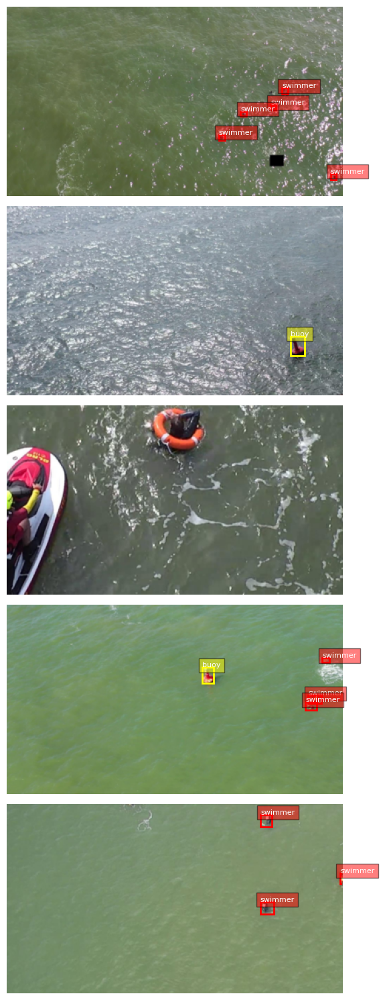

In [33]:
# Perform predictions and visualize
images = []
outputs = []
with torch.no_grad():
    for i, (image_batch, _) in enumerate(val_data_loader):
        if len(images) >= 10:
            break
        for image in image_batch:
            if len(images) >= 10:
                break
            image = image.to(device)
            output = model([image])
            if len(output) > 0:  # Ensure there is at least one prediction
                images.append(image)
                outputs.append({k: v for k, v in output[0].items()})

# Visualize the predictions
visualize_samples(images, outputs, category_colors,classes_to_idx, num_samples=5)

# Test Images

In [34]:
output_dir = '/content/patches_test'
os.makedirs(output_dir, exist_ok=True)

In [35]:
def check_and_rotate_image(image):
    """Rotate the image if its height is greater than its width and return the image and a flag indicating rotation."""
    width, height = image.size
    if height > width:
        image = image.rotate(90, expand=True)  # Rotates 90 counter-clockwise
        return image, True
    return image, False

In [36]:
def create_patches(image, output_dir, image_filename, overlap_ratio=0.2):
    """Create image patches and handle image rotation if necessary."""
    image, was_rotated = check_and_rotate_image(image)
    width, height = image.size

    patch_width = int(width / 2)
    patch_height = int(height / 2)
    overlap_width = int(patch_width * overlap_ratio)
    overlap_height = int(patch_height * overlap_ratio)

    patches = []
    for i in range(2):  # Three rows
        for j in range(2):  # Three columns
            left = i * (patch_width - overlap_width)
            top = j * (patch_height - overlap_height)
            right = left + patch_width
            bottom = top + patch_height
            patch = image.crop((left, top, right, bottom))
            patch_filename = f'{os.path.splitext(image_filename)[0]}_{i}_{j}.jpg'
            patch_path = os.path.join(output_dir, patch_filename)
            patch.save(patch_path)
            patches.append((patch_filename, left, top, right, bottom, was_rotated))

    return patches

image_path = 'SeaDroneSee/test/1669.jpg'
img_filename = os.path.basename(image_path)
img_filename_temp = img_filename.split('.')[0]
img = Image.open(image_path)
create_patches(img, output_dir, img_filename, overlap_ratio=0.2)


[('1669_0_0.jpg', 0, 0, 2728, 1816, False),
 ('1669_0_1.jpg', 0, 1453, 2728, 3269, False),
 ('1669_1_0.jpg', 2183, 0, 4911, 1816, False),
 ('1669_1_1.jpg', 2183, 1453, 4911, 3269, False)]

# With Patches

In [40]:
def get_transform():
    transforms = []
    transforms.append(Tv2.ToDtype(torch.float, scale=True))
    transforms.append(Tv2.ToPureTensor())
    return Tv2.Compose(transforms)


# Function to show image with bounding boxes and save it to disk
def show_image_with_boxes(img, targets, category_colors, classes_to_idx, output_path):
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(img)
    boxes = targets['boxes'].cpu().numpy()
    labels = targets['labels'].cpu().numpy()
    scores = targets['scores'].cpu().numpy()
    for bbox, label, score in zip(boxes, labels, scores):
        if score >= 0.3:  # Only show boxes with confidence score >= 0.3
            w = bbox[2] - bbox[0]
            h = bbox[3] - bbox[1]
            color = category_colors.get(label, 'gray')  # Use gray for unmapped classes
            rect = patches.Rectangle((bbox[0], bbox[1]), w, h, linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            # ax.text(bbox[0], bbox[1], f'{classes_to_idx[label]}: {score:.2f}', color='white', fontsize=12, bbox=dict(facecolor=color, alpha=0.5))
    plt.axis('off')
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    # plt.close()

# Function to predict and visualize the output for a single image
def predict_and_visualize(image_path, model, device, category_colors, classes_to_idx, output_path):
    # Load and transform the image
    transforms = get_transform()

    img = PIL.Image.open(image_path).convert("RGB")
    img = img.resize((382, 216), PIL.Image.BILINEAR)  # Resize the image
    # print(img.size)
    img_tensor = F.to_tensor(img)
    img_trans = transforms(img_tensor).to("cuda:0")


    # Perform prediction
    with torch.no_grad():
        output = model(torch.unsqueeze(img_trans,dim=0))[0]

    # Visualize and save the output
    show_image_with_boxes(img, output, category_colors, classes_to_idx, output_path)

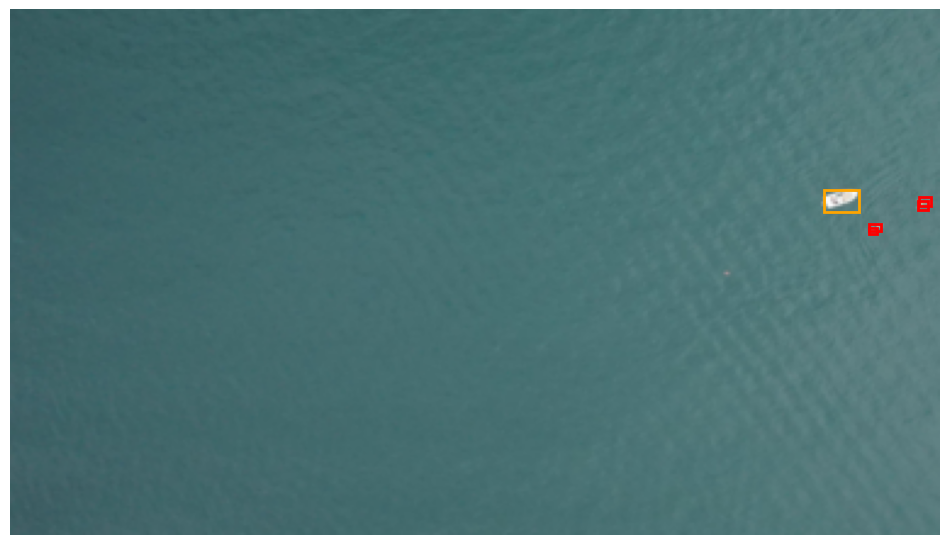

In [41]:
# Example usage
image_path = "/content/patches_test/1669_0_1.jpg"
os.makedirs('/content/patches_test/outputs', exist_ok=True)  # Ensure the output directory exists
output_path = '/content/patches_test/outputs/output_image.jpg'  # Path to save the output image

# Predict and visualize the output for the single image
predict_and_visualize(image_path, model, device, category_colors, classes_to_idx, output_path)


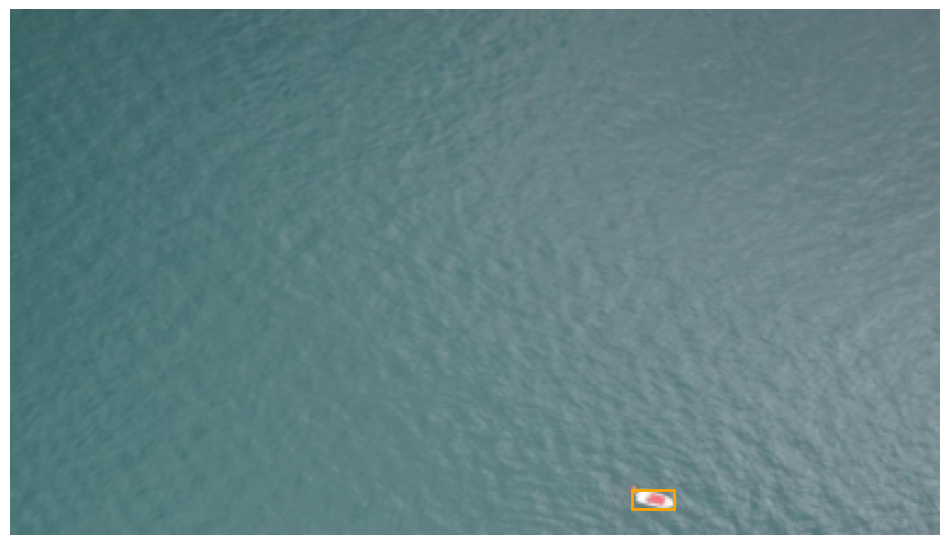

In [42]:
# Example usage
image_path = "/content/patches_test/1669_1_0.jpg"
os.makedirs('/content/patches_test/outputs', exist_ok=True)  # Ensure the output directory exists
output_path = '/content/patches_test/outputs/output_image.jpg'  # Path to save the output image

# Predict and visualize the output for the single image
predict_and_visualize(image_path, model, device, category_colors, classes_to_idx, output_path)